In [4]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score as r2, mean_absolute_error as mae, mean_squared_error as mse, accuracy_score
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVC

from scipy.spatial.distance import cdist
from mpl_toolkits.mplot3d.axes3d import Axes3D

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.style.use(['dark_background']) # тёмный фон графиков

In [5]:
train_dataset = '../../data/house_price/train.csv'
test_dataset = '../../data/house_price/test.csv'
prepared_train_dataset = '../../data/house_price/train_prepared.csv'
df_orig = pd.read_csv(train_dataset)
df_test_orig = pd.read_csv(test_dataset)
print(df_orig.shape)
df_orig.head()

(10000, 20)


,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644


## Kaggle score
корреция года постройки

Замена пропущенных значений Healthcare_1 на медианные

Пустые LifeSquare = Square /1.62. 

Если жилая площадь больше общей площади, то общая площадь = жилой. 

замена LifeSquare < 10 на Square / 1.62

если Room == 0, то Room = 1

удвлил => если HouseFloor == 0, то HouseFloor = Floor * 2

если этаж квартиры выше этажности дома, то этаж квартиры равен этажности дома

In [6]:
df = df_orig
df_test = df_test_orig

# Замена некорректных значений года пострйки 4968 и 20052010 в строчке № 4189 и 1497 столбца HouseYear
df['HouseYear'].describe().round()
df['HouseYear'].sort_values(ascending=False).head()
# замена значения в строчке № 4189 столбца HouseYear на значение
df.loc[4189, 'HouseYear'] = 1968
df.loc[1497, 'HouseYear'] = 2005
df.loc[1497, 'HouseYear']

df = pd.get_dummies(df)
df_test = pd.get_dummies(df_test)

#df.loc[df['LifeSquare'].isnull(), 'LifeSquare'] = df['LifeSquare'].median()
df.loc[df['Healthcare_1'].isnull(), 'Healthcare_1'] = df['Healthcare_1'].median()
#df_test.loc[df_test['LifeSquare'].isnull(), 'LifeSquare'] = df_test['LifeSquare'].median()
df_test.loc[df_test['Healthcare_1'].isnull(), 'Healthcare_1'] = df_test['Healthcare_1'].median()

# вычисление коэффициента отношения площадей
#df['sq_mult'] = df['Square'] / df['LifeSquare']
#df_test['sq_mult'] = df_test['Square'] / df_test['LifeSquare']

df.loc[df['LifeSquare'].isnull(), 'LifeSquare'] = df['Square'] / 1.62  # mean & 50% sq_mult
df_test.loc[df_test['LifeSquare'].isnull(), 'LifeSquare'] = df_test['Square'] / 1.62

# Если жилая площадь больше общей площади, то общая площадь = жилой
df['Square'] = np.where((df['LifeSquare'] > df['Square']), df['LifeSquare'], df['Square'])
df_test['Square'] = np.where((df_test['LifeSquare'] > df_test['Square']), df_test['LifeSquare'], df_test['Square'])

# замена LifeSquare < 10 на Square / 1.62
df['LifeSquare'] = np.where((df['LifeSquare'] < 10), df['Square'] / 1.62, df['LifeSquare'])
df_test['LifeSquare'] = np.where((df_test['LifeSquare'] < 10), df_test['Square'] / 1.62, df_test['LifeSquare'])

# если Room = 0, то Room = 1
df['Rooms'] = np.where((df['Rooms'] == 0), 1, df['Rooms'])

# Замену HouseFloor = 0 на df['Floor'] * 2 в 269 квартрах. Т.е. квартиры в среднем этаже
#df['HouseFloor'] = np.where((df['HouseFloor'] == 0), df['Floor'] * 2, df['HouseFloor'])

# если этаж квартиры выше этажности дома, то этаж квартиры равен этажности дома
df['Floor'] = np.where((df['Floor'] > df['HouseFloor']), df['HouseFloor'] , df['Floor'])

y = df['Price']
x = df.drop('Price', axis=1)

df.describe()
x

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_3,Healthcare_1,Helthcare_2,Shops_1,Ecology_2_A,Ecology_2_B,Ecology_3_A,Ecology_3_B,Shops_2_A,Shops_2_B
0,14038,35,2.0,47.981561,29.442751,6.0,7.0,9.0,1969,0.089040,...,5,900.0,0,11,0,1,0,1,0,1
1,15053,41,3.0,65.683640,40.049543,8.0,7.0,9.0,1978,0.000070,...,1,240.0,1,16,0,1,0,1,0,1
2,4765,53,2.0,44.947953,29.197612,0.0,8.0,12.0,1968,0.049637,...,0,229.0,1,3,0,1,0,1,0,1
3,5809,58,2.0,53.352981,52.731512,9.0,8.0,17.0,1977,0.437885,...,3,1084.0,0,5,0,1,0,1,0,1
4,10783,99,1.0,39.649192,23.776169,7.0,11.0,12.0,1976,0.012339,...,1,2078.0,2,4,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,77,32,2.0,50.401785,30.476203,5.0,5.0,5.0,1968,0.135650,...,6,350.0,3,11,0,1,0,1,0,1
9996,6159,18,1.0,41.521546,20.539216,9.0,13.0,13.0,2000,0.000000,...,0,900.0,0,5,0,1,0,1,1,0
9997,5123,27,1.0,47.939008,29.591980,1.0,12.0,16.0,2015,0.072158,...,1,900.0,0,0,0,1,0,1,1,0
9998,5400,75,2.0,43.602562,33.840147,8.0,1.0,5.0,1961,0.307467,...,9,325.0,2,5,0,1,1,0,0,1


In [7]:
def reduce_dims_to_2D_space_with_PCA(df):
    pca = PCA(n_components=2)
    components = pca.fit_transform(df)
    return pd.DataFrame(data = components, columns = ['component_1', 'component_2'])
    
def reduce_dims_to_3D_space_with_PCA(df):
    pca = PCA(n_components=3)
    components = pca.fit_transform(df)
    return pd.DataFrame(data = components, columns = ['component_1', 'component_2', 'component_3'])

def reduce_dims_to_2D_space_with_TSNE(df):
    tsne = TSNE(n_components=2, learning_rate=250, random_state=42)
    components = tsne.fit_transform(df)
    return pd.DataFrame(data = components, columns = ['component_1', 'component_2'])
    
def reduce_dims_to_3D_space_with_TSNE(df):
    tsne = TSNE(n_components=3, learning_rate=250, random_state=42)
    components = tsne.fit_transform(df)
    return pd.DataFrame(data = components, columns = ['component_1', 'component_2', 'component_3'])  

In [8]:
def display_components_in_2D_space(components_df, labels=None):
    components_with_labels_df = pd.concat([components_df, labels], axis=1)

    if labels is not None:
        components_with_labels_df.plot(kind='scatter', x='component_1', y='component_2', 
                                         c=labels.name, cmap=plt.get_cmap('jet'),
                                         alpha=0.5, figsize=(10,8), s=2)
    else:
        components_with_labels_df.plot(kind='scatter', x='component_1', y='component_2', alpha=0.5, figsize=(10,8))

    plt.xlabel('component_1')
    plt.ylabel('component_2')
    plt.title('2D mapping of objects')
    plt.legend(labels)
    plt.show()

def display_components_in_3D_space(components_df, labels=None):
    components_with_labels_df = pd.concat([components_df, labels], axis=1)

    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111, projection='3d')
    
    if labels is not None:
        ax.scatter(components_with_labels_df['component_1'], 
                   components_with_labels_df['component_2'], 
                   components_with_labels_df['component_3'], 
                   c=labels, cmap=plt.get_cmap('jet'), alpha=0.5)
    else:
        ax.scatter(components_with_labels_df['component_1'], 
                   components_with_labels_df['component_2'], 
                   components_with_labels_df['component_3'], 
                   alpha=0.5)

    ax.set_xlabel('component_1')
    ax.set_ylabel('component_2')
    ax.set_zlabel('component_3')
    plt.title('3D mapping of objects')
    plt.show()

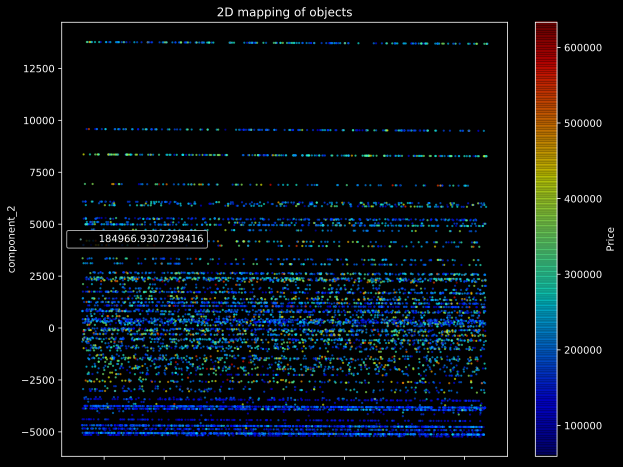

In [16]:
components_2d = reduce_dims_to_2D_space_with_PCA(x)
components_2d_test = reduce_dims_to_2D_space_with_PCA(df_test)
display_components_in_2D_space(components_2d, y)

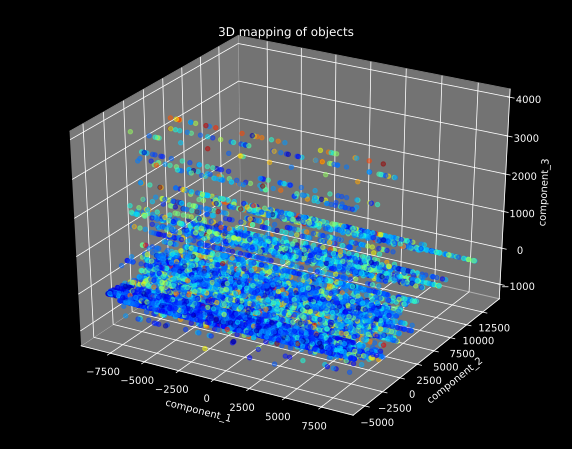

In [21]:
components_3d = reduce_dims_to_3D_space_with_PCA(x)
components_3d_test = reduce_dims_to_3D_space_with_PCA(df_test)
display_components_in_3D_space(components_3d, y)

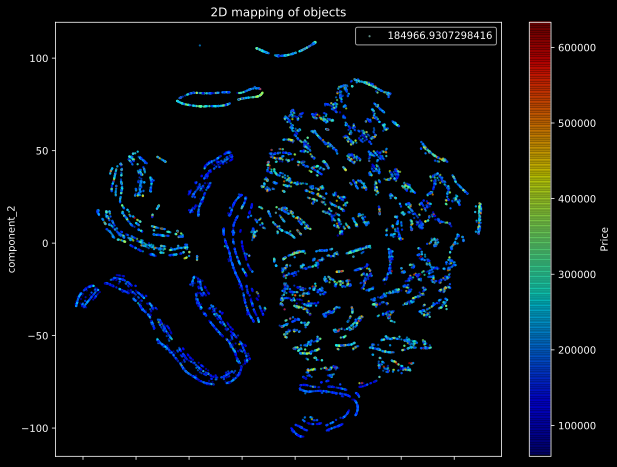

In [26]:
components_2d = reduce_dims_to_2D_space_with_TSNE(x)
components_2d_test = reduce_dims_to_2D_space_with_TSNE(df_test)
display_components_in_2D_space(components_2d, y)

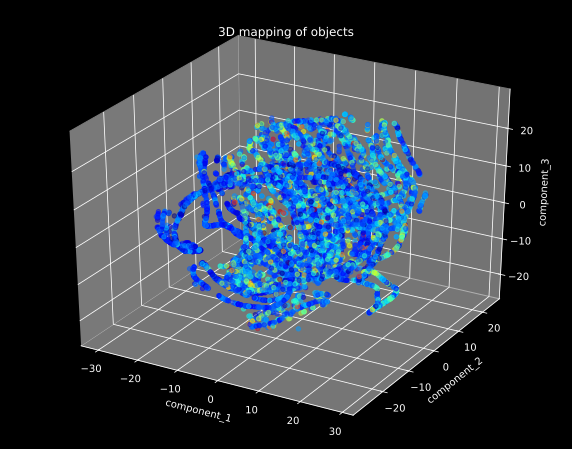

In [12]:
components_3d = reduce_dims_to_3D_space_with_TSNE(x)
components_3d_test = reduce_dims_to_3D_space_with_TSNE(df_test)
display_components_in_3D_space(components_3d, y)

In [27]:
x_ext = pd.concat([x, components_2d], axis=1)
df_test_ext = pd.concat([df_test, components_2d_test], axis=1)
pd.options.display.max_columns=200
x_ext.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Ecology_2_A,Ecology_2_B,Ecology_3_A,Ecology_3_B,Shops_2_A,Shops_2_B,component_1,component_2
0,14038,35,2.0,47.981561,29.442751,6.0,7.0,9.0,1969,0.089040,33,7976,5,900.0,0,11,0,1,0,1,0,1,9.115948,-8.430564
1,15053,41,3.0,65.683640,40.049543,8.0,7.0,9.0,1978,0.000070,46,10309,1,240.0,1,16,0,1,0,1,0,1,-57.231033,-6.213504
2,4765,53,2.0,44.947953,29.197612,0.0,8.0,12.0,1968,0.049637,34,7759,0,229.0,1,3,0,1,0,1,0,1,61.363277,51.330772
3,5809,58,2.0,53.352981,52.731512,9.0,8.0,17.0,1977,0.437885,23,5735,3,1084.0,0,5,0,1,0,1,0,1,39.827068,38.363136
4,10783,99,1.0,39.649192,23.776169,7.0,11.0,12.0,1976,0.012339,35,5776,1,2078.0,2,4,0,1,0,1,0,1,44.531296,-13.382071


In [28]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_ext)

x_test = scaler.transform(df_test_ext)

model = RandomForestRegressor(random_state=42, max_depth=14)
model.fit(x_train, y)

y_test = model.predict(x_test)

y_pred_train = model.predict(x_train)

r2_train = r2(y, y_pred_train)
print(f'R2 train: {r2_train.round(4)}')
model

R2 train: 0.9209


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=14, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

Добавление TSNE 2х компонент R2 train = 0.9209. скор = 0.72745
Добавление TSNE 3х компонент R2 train = 0.9213. скор = 0.72254 (лучший = 0.73620). 
Добавление 2х компонент PCA. R2 train = 0.9215. скор = 0.72830
Добавление 3х компонент PCA. R2 train = 0.9208. скор = 0.72249

In [29]:
#check_test = pd.DataFrame({'y_test_1': y_valid.round(), 'y_pred': y_pred.round()})
#check_test.head(10)
df_y_test = pd.DataFrame({'Id': df_test_orig['Id'], 'Price': y_test})
df_y_test.to_csv('../../data/house_price/AKalinichenko_predictions.csv', index=False, encoding='utf-8')
print('Done!')

Done!
